Importing the modules

# Welcome to the notebook 🙂

### Task 1 - Importing the Dataset

In [1]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

2026-02-06 18:02:50.383604: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Modules are imported!


In [2]:
data=pd.read_csv("Creditcard_dataset.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Check the data shape

In [3]:
data.shape

(50492, 31)

Let's see how many genuine and limited fraudulent records we have

In [7]:
data.Class.value_counts()

0    50000
1      492
Name: Class, dtype: int64

### Task 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [8]:
data.dropna(inplace=True)

Removing Time column

In [10]:
data=data.drop(axis=1,columns='Time')

Feature Scaling of Amount column

In [13]:
scale=StandardScaler()
data['Amount']=scale.fit_transform(data[['Amount']])
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Let's split the genuine and fraud records into separate dataframes

In [14]:
data_fraud=data[data.Class==1]
data_geniue=data[data.Class==0]

Split the data into features and labels

In [17]:
data.head()
x=data.drop("Class",axis=1)
y=data.Class

Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [19]:
pca=PCA(2)
transformed_data=pca.fit_transform(x)
df=pd.DataFrame(transformed_data)
df['label']=y
df

,0,1,label
0,-0.447835,1.197283,0
1,-0.582383,0.257529,0
2,-0.939389,-0.728294,0
3,-0.630764,-0.499229,0
4,-0.536286,-1.055459,0
...,...,...,...
50487,10.855749,-2.787094,1
50488,6.927751,-4.949581,1
50489,7.038192,-2.785134,1
50490,11.649175,-1.991493,1


Let's Use a scatter plot to visualize our data

In [20]:
px.scatter(df,x=0,y=1,color=df.label.astype(str))

### Task 3 - Building the Generator Model

Write a method to create the Generator model architecture

In [53]:
def build_generator():
    model=Sequential()
    model.add(Dense(32,activation='relu',input_dim=29,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    
    model.add(Dense(64,activation='relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(128,activation='relu'))
    model.add(BatchNormalization())
    
    
    model.add(Dense(29,activation='linear'))
    model.summary()
    
    return model
build_generator()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_138 (Dense)           (None, 32)                960       
                                                                 
 batch_normalization_45 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_139 (Dense)           (None, 64)                2112      
                                                                 
 batch_normalization_46 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_140 (Dense)           (None, 128)               8320      
                                                                 
 batch_normalization_47 (Bat  (None, 128)            

### Task 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [54]:
def build_descriminator():
    model=Sequential()
    model.add(Dense(128,input_dim=29, activation='relu',kernel_initializer='he_uniform'))
    
    model.add(Dense(64,activation='relu'))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(16,activation='relu'))
    
    model.add(Dense(1,activation='sigmoid'))
    model.compile(optimizer='adam',loss='binary_crossentropy')
    model.summary()
    return model

build_descriminator()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_142 (Dense)           (None, 128)               3840      
                                                                 
 dense_143 (Dense)           (None, 64)                8256      
                                                                 
 dense_144 (Dense)           (None, 32)                2080      
                                                                 
 dense_145 (Dense)           (None, 32)                1056      
                                                                 
 dense_146 (Dense)           (None, 16)                528       
                                                                 
 dense_147 (Dense)           (None, 1)                 17        
                                                                 
Total params: 15,777
Trainable params: 15,777
Non-tra

### Task 5 - Combine Generator and Discriminator models to Build The GAN

In [55]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

def build_gan(generator, discriminator):
    discriminator.trainable = False

    gan_input = Input(shape=(29,)) 
    x = generator(gan_input)
    gan_output = discriminator(x)

    gan = Model(gan_input, gan_output)
    gan.summary()
    return gan


Let's create a method that generates synthetic data using the Generator

In [56]:
def generate_synthetic_data(generator, num_sample):
    noise = np.random.normal(
        0, 
        1, 
        (num_sample, generator.input_shape[1])
    )
    fake_data = generator.predict(noise)
    return fake_data

### Task 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [57]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = data_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_148 (Dense)           (None, 32)                960       
                                                                 
 batch_normalization_48 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_149 (Dense)           (None, 64)                2112      
                                                                 
 batch_normalization_49 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_150 (Dense)           (None, 128)               8320      
                                                                 
 batch_normalization_50 (Bat  (None, 128)            

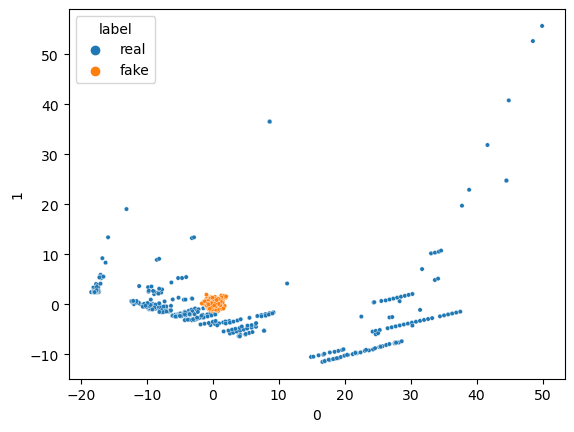

16/16 [==============================] - 0s 6ms/step


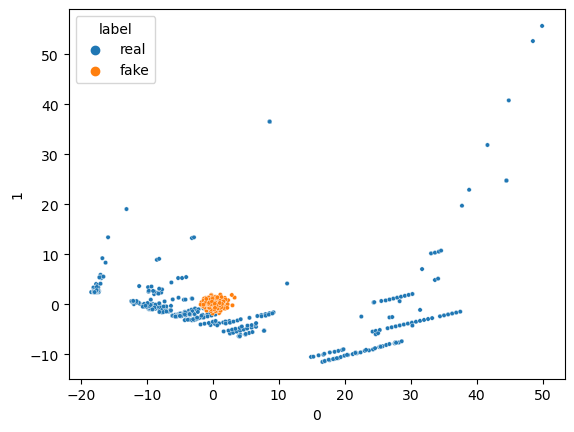

16/16 [==============================] - 0s 6ms/step


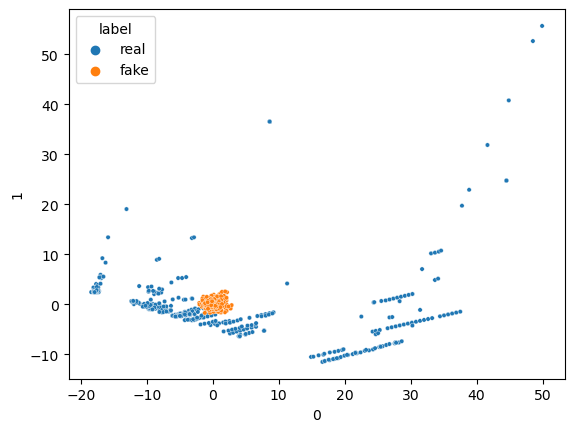

16/16 [==============================] - 0s 6ms/step


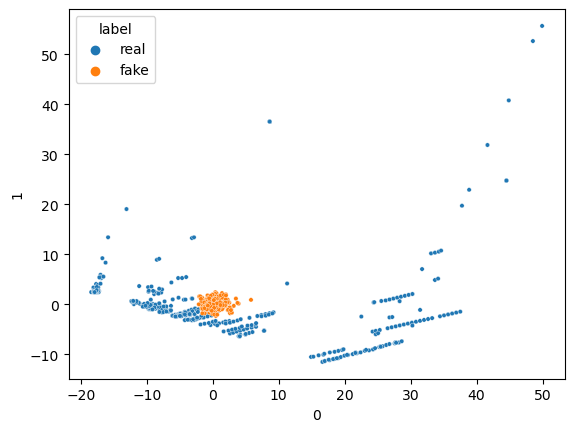

16/16 [==============================] - 0s 6ms/step


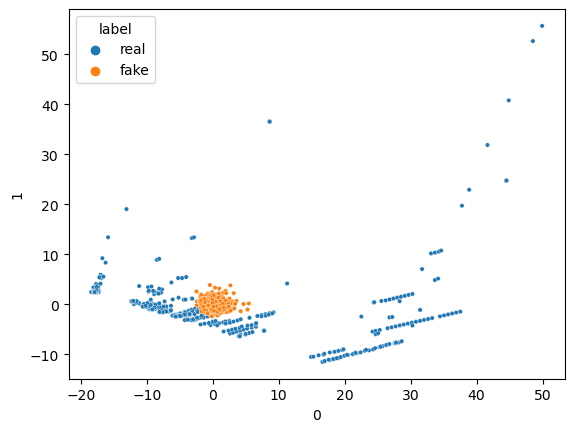

16/16 [==============================] - 0s 6ms/step


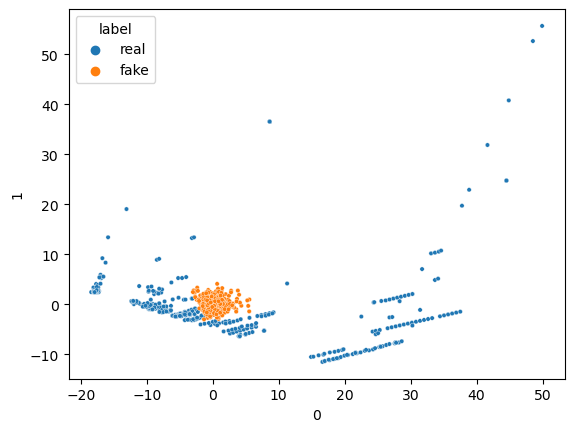

16/16 [==============================] - 0s 802us/step


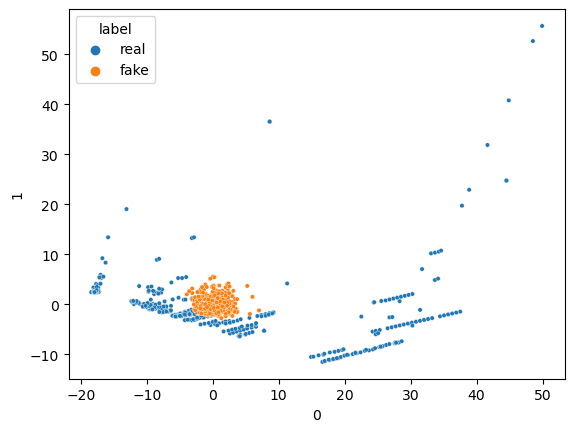

16/16 [==============================] - 0s 778us/step


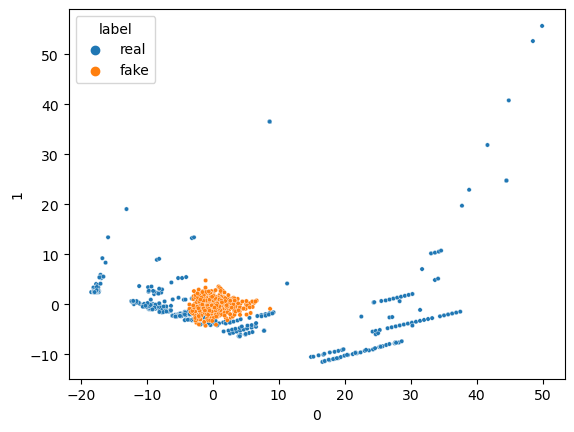

16/16 [==============================] - 0s 791us/step


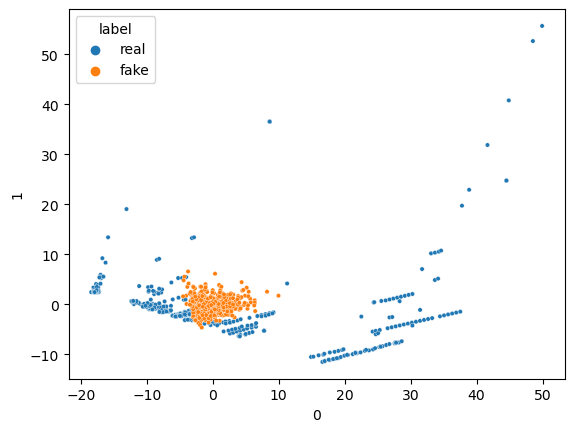

16/16 [==============================] - 0s 814us/step


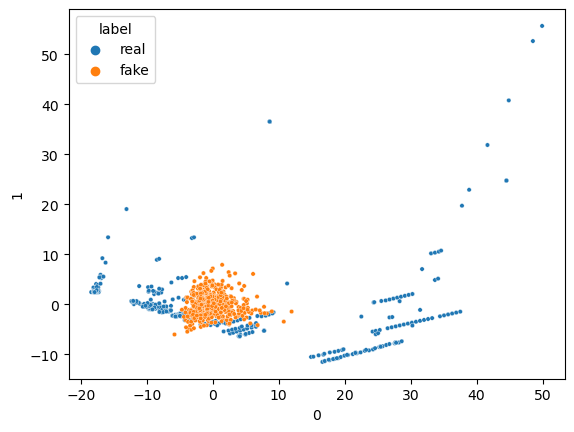

1/1 [==============================] - 0s 16ms/step


In [58]:
generator = build_generator()
discriminator = build_descriminator()   # function name is fine

gan = build_gan(generator, discriminator)
gan.compile(optimizer='adam', loss='binary_crossentropy')

num_epochs = 100
batch_size = 32
half_batch = batch_size // 2

for epoch in range(num_epochs):

    x_fake = generate_synthetic_data(generator, half_batch)
    y_fake = np.zeros((half_batch, 1))

    x_real = data_fraud.drop("Class", axis=1).sample(half_batch)
    y_real = np.ones((half_batch, 1))

    discriminator.trainable = True
    discriminator.train_on_batch(x_real, y_real)
    discriminator.train_on_batch(x_fake, y_fake)

    noise = np.random.normal(0, 1, (batch_size, 29))
    y_gan = np.ones((batch_size, 1))

    discriminator.trainable = False
    gan.train_on_batch(noise, y_gan)
    
    if epoch%10==0:
        monitor_generator(generator)


### Task 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [63]:
synthetic_data=generate_synthetic_data(generator,1000)
df=pd.DataFrame(synthetic_data)
df['label']='fake'

df2 = data_fraud.drop('Class', axis=1)
df2['label']='real'
df2.columns=df.columns
combined_df=pd.concat([df,df2])
combined_df


32/32 [==============================] - 0s 707us/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,-0.126465,0.960313,-0.840153,2.147858,0.086804,-0.425339,-1.082106,0.695129,-1.561830,-0.723476,...,1.086782,0.926238,0.254976,0.280107,-0.054942,-0.797729,0.232960,1.019706,-0.037061,fake
1,0.140377,-1.333109,0.381220,-0.628277,0.336367,0.464591,0.729995,0.274402,-0.873850,-1.003273,...,0.390286,0.092356,-0.399284,-0.017830,1.024790,0.483566,0.113465,0.868164,1.062466,fake
2,-0.250069,0.109452,0.207532,0.365504,-0.035027,-0.088476,-0.229031,0.375614,-0.760327,-0.607493,...,-0.556071,0.076958,0.345106,-0.538815,0.928801,-0.147460,-0.677370,0.708775,-0.369358,fake
3,-0.265402,-0.674248,-0.595829,0.454115,0.335940,0.407088,-0.707221,0.007121,-0.284277,-0.328359,...,0.433403,0.703259,0.336727,0.134915,0.453903,0.253283,-0.331659,0.265605,-0.389476,fake
4,-1.116444,-0.215692,-1.145207,0.518269,0.669173,-0.273168,-0.933229,-0.102985,-1.123318,-1.642263,...,0.818203,0.593187,-1.012279,-0.356132,0.951699,0.684049,-0.950246,0.567763,0.328687,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [64]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>